
 CRISP-DM Project: Breast-cancer Detection
 




# Phase 1 — Business Understanding
## 1. Problem Statement

Breast cancer remains one of the most common and life-impacting cancers worldwide. Early and accurate detection is essential for improving patient outcomes, guiding clinical decisions, and reducing unnecessary medical interventions.

Machine learning (ML) offers powerful tools for analyzing biomedical datasets such as the *Wisconsin Diagnostic Breast Cancer (WDBC)* dataset. This notebook enriches the original WDBC dataset by merging it with the WPBC (Prognostic) dataset to increase the sample size of malignant cases.

The goal is to evaluate how well each model distinguishes between **benign** and **malignant** tumors and determine which methods provide the strongest diagnostic support for medical use.
....Business Objectives (BO)....

## BO1 — 
 Detect breast cancer as early as possible.

## BO2 — 
Accelerate and improve diagnostic decision-making to reduce errors.

## BO3 —
 Reduce unnecessary tests, biopsies, and medical procedures.

## BO4 — 
 Prioritize patients who require urgent medical attention.

Breast cancer diagnosis relies heavily on early detection (BO1) and accurate decision-making (BO2).  
This project aims to build ML models that support clinicians in detecting malignant tumors quickly and reliably.


....Data Science Objectives (DSO)....

## DSO1  
Maximize the True Positive Rate (Recall) to ensure malignant tumors are detected as early as possible.
## DSO2 
Reduce the number of false-positive predictions to improve diagnostic precision and limit unnecessary follow-up procedures.
## DSO3
Ensure that the selected models are fast, interpretable, and clinically actionable, enabling their use in real-world medical settings.
## DSO4
Develop models that generalize well across diverse tumor characteristics and patient profiles, ensuring consistent performance.
###  Interpretation
This phase defines why the model exists and which clinical outcomes it aims to influence.
By clearly linking Business Objectives (BO) to Data Science Objectives (DSO), all subsequent steps—data preparation, modeling, evaluation, and model selection—are directly aligned with real medical requirements.

This alignment ensures that model performance is evaluated not only in terms of statistical accuracy, but also in terms of clinical usefulness, reliability, and patient impact



| **DSO**  | **Objective**                                         | **Primary Model**                 | **Secondary Model**                | **Target Metric**      |
| -------- | ----------------------------------------------------- | --------------------------------- | ---------------------------------- | ---------------------- |
| **DSO1** | Maximize Early Detection (**High Recall / TPR**)      | **MLP (500-500-500, Early Stop)** | **L2NN (Euclidean)**                | **Recall ≥ 95%**       |
| **DSO2** | Minimize False Positives (**High Selectivity / TNR**) | **Linear SVM (C tuned)**          | **Random Forest**                  | **Selectivity ≥ 90%**  |
| **DSO3** | Fast, Interpretable, and Clinically Actionable Model  | **Logistic Regression(ElasticNet)**| **Standard Logistic Regression**   | **Latency < 0.01 sec** |
| **DSO4** | Robust Generalization Across Diverse Tumor Types      | **Random Forest**                 | **GRU-SVM Proxy (RBF tuned)**      | **Accuracy ≥ 95%**     |


 # Phase 2  — Data Understanding
 We inspect the dataset to understand its structure, distribution, potential imbalance, and clinical relevance.

###  DSO Alignment
- **DSO1:** Understanding malignant vs. benign distribution helps optimize recall.  
- **DSO2:** Spotting noisy features helps reduce false positives.  
- **DSO4:** Identifying feature variability supports generalization across tumor types.

###  Interpretation
Data exploration reveals:
- Whether the classes are imbalanced  
- Which features correlate with malignancy  
- Which measurements may introduce diagnostic errors  

This understanding guides data cleaning and modeling choices.


In [43]:
# importing libraries
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline

In [44]:
# Load the enriched dataset from local CSV
# This file was created by merging WDBC and WPBC datasets
try:
    df = pd.read_csv('data_enriched.csv')
    print(f"Successfully loaded enriched data. Shape: {df.shape}")
except FileNotFoundError:
    print("Error: 'data_enriched.csv' not found. Please run the download script first.")
    # Fallback to original if needed
    # df = pd.read_csv('data.csv')


Successfully loaded enriched data. Shape: (767, 32)


In [45]:
# displaying first five rows
df.head(20)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.26540,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.18600,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.24300,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.25750,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.16250,0.2364,0.07678
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.17410,0.3985,0.12440
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.19320,0.3063,0.08368
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.15560,0.3196,0.11510
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.20600,0.4378,0.10720
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.22100,0.4366,0.20750


In [46]:
# counts of unique rows in the 'diagnosis' column
df['diagnosis'].value_counts()

diagnosis
M    410
B    357
Name: count, dtype: int64

In [47]:
# shape of the dataframe
df.shape

(767, 32)

In [48]:
# concise summary of dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 767 entries, 0 to 766
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       767 non-null    int64  
 1   diagnosis                767 non-null    object 
 2   radius_mean              767 non-null    float64
 3   texture_mean             767 non-null    float64
 4   perimeter_mean           767 non-null    float64
 5   area_mean                767 non-null    float64
 6   smoothness_mean          767 non-null    float64
 7   compactness_mean         767 non-null    float64
 8   concavity_mean           767 non-null    float64
 9   concave_points_mean      767 non-null    float64
 10  symmetry_mean            767 non-null    float64
 11  fractal_dimension_mean   767 non-null    float64
 12  radius_se                767 non-null    float64
 13  texture_se               767 non-null    float64
 14  perimeter_se             7

In [49]:
# column names
df.columns


Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave_points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [50]:
# checking for null values
df.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave_points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave_points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave_points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [51]:
# descriptive statistics of data
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
count,7.670000e+02,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,...,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000,767.000000
mean,2.304522e+07,14.975318,20.060574,97.877419,736.245111,0.097992,0.114230,0.106210,0.058692,0.184154,...,17.496074,26.829048,115.802464,1015.949935,0.135351,0.282877,0.314653,0.131172,0.298679,0.085722
std,1.083817e+08,3.721421,4.492088,25.609881,377.849136,0.013952,0.054680,0.082859,0.041066,0.027868,...,5.126723,6.414266,35.522849,617.591381,0.023166,0.166210,0.212639,0.067220,0.067112,0.019138
min,8.423000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.651325e+05,12.210000,16.935000,78.300000,459.500000,0.087930,0.071385,0.037365,0.024090,0.163950,...,13.460000,22.070000,87.470000,553.300000,0.120000,0.163450,0.144950,0.078460,0.255500,0.072560
50%,9.029760e+05,14.250000,19.660000,93.630000,632.600000,0.097730,0.107400,0.092520,0.052710,0.181500,...,16.330000,26.380000,108.500000,811.300000,0.135100,0.246300,0.291400,0.130800,0.286800,0.081340
75%,8.711102e+06,17.640000,22.490000,115.500000,975.350000,0.106850,0.145700,0.157050,0.086980,0.198100,...,20.975000,30.960000,140.200000,1330.000000,0.149750,0.374850,0.441200,0.182950,0.325800,0.094690
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


<Axes: xlabel='diagnosis', ylabel='count'>

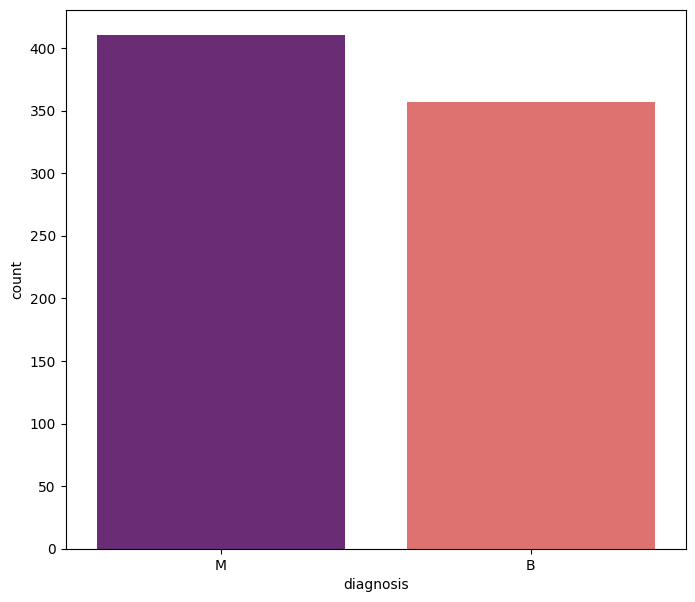

In [52]:
# countplot
plt.figure(figsize = (8,7))
sns.countplot(x="diagnosis", data=df, palette='magma')

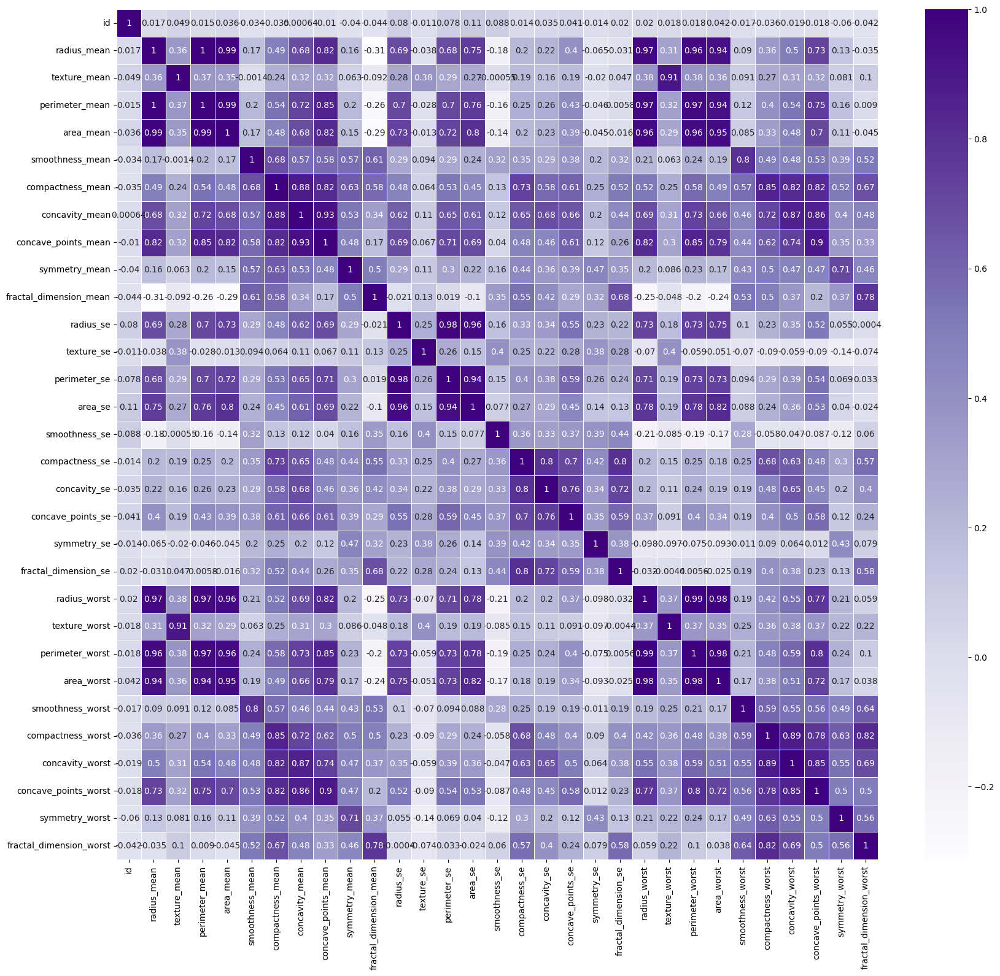

In [53]:
# heatmap
plt.figure(figsize=(20,18))
# compute correlation only on numeric columns to avoid converting non-numeric 'diagnosis'
num_df = df.select_dtypes(include=[np.number])
sns.heatmap(num_df.corr(), annot=True, linewidths=.5, cmap="Purples")
plt.show()

1. High redundancy between several variables (correlation > 0.9):
We observe very dark blocks (high correlation), notably between:

Cell size-related variables:
radius_mean ↔ perimeter_mean ↔ area_mean

The same applies for their _worst and _se equivalents.

These variables essentially measure the same thing:
As the radius increases, the perimeter and area also increase mechanically.

2. High correlation between “shape” variables:
Variables related to irregularity and contour sharpness also show very strong correlations:

concavity_mean

concave points_mean

compactness_mean

These three variables increase together when the tumor’s contour becomes more irregular.

3. _worst variables are always highly correlated with _mean variables:
Examples:

radius_mean ↔ radius_worst

texture_mean ↔ texture_worst

concave points_mean ↔ concave points_worst

This confirms that _worst variables are not independent:
They simply represent the maximum observed value for the same characteristic.

4. _se variables are less correlated:
They reflect the variation or irregularity of the measurements, so they provide different information.

5. Useless variables detected:
Two columns show little usefulness for the model:

id → useless identifier

Unnamed: 32 → empty column (NaN)

So they should be removed.

6. Correlations close to zero:
Some variables show very little relationship with others, e.g.:

smoothness_se

fractal_dimension_se

They represent very fine details that do not directly depend on the overall size/shape.

In [54]:
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave_points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [55]:
# Getting Mean Columns with diagnosis
m_col = ['diagnosis','radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean']

# Getting Se Columns with diagnosis
s_col = ['diagnosis','radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se',
       'fractal_dimension_se']

# Getting Worst column with diagnosis
w_col = ['diagnosis','radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave_points_worst',
       'symmetry_worst', 'fractal_dimension_worst']

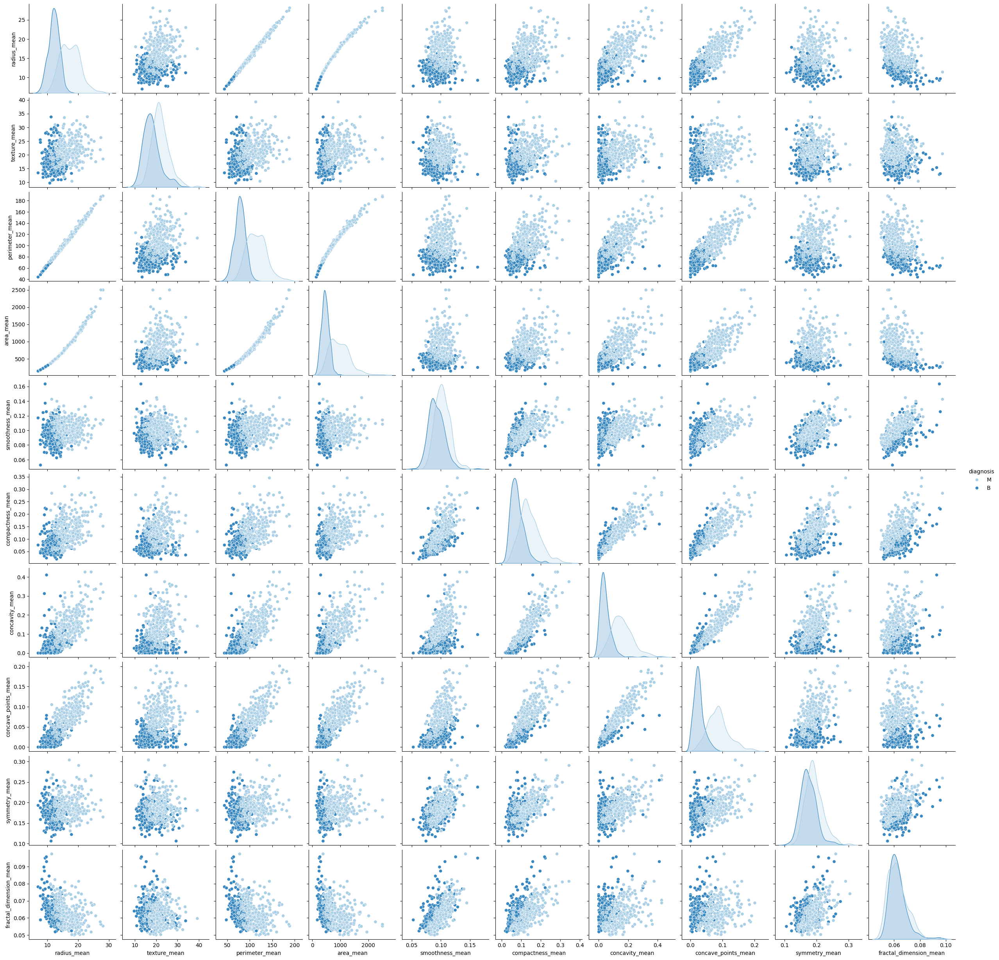

In [56]:
# pairplot for mean columns
sns.pairplot(df[m_col],hue = 'diagnosis', palette='Blues')

## Interpretation:
The pairplot of the mean variables shows that malignant tumors have significantly higher values for size-related measures (radius_mean, area_mean, perimeter_mean) as well as for shape irregularity measures (concavity_mean, concave_points_mean).
This clear visual separation between the two classes confirms the strong discriminative power of these variables, which supports their importance in classification models.

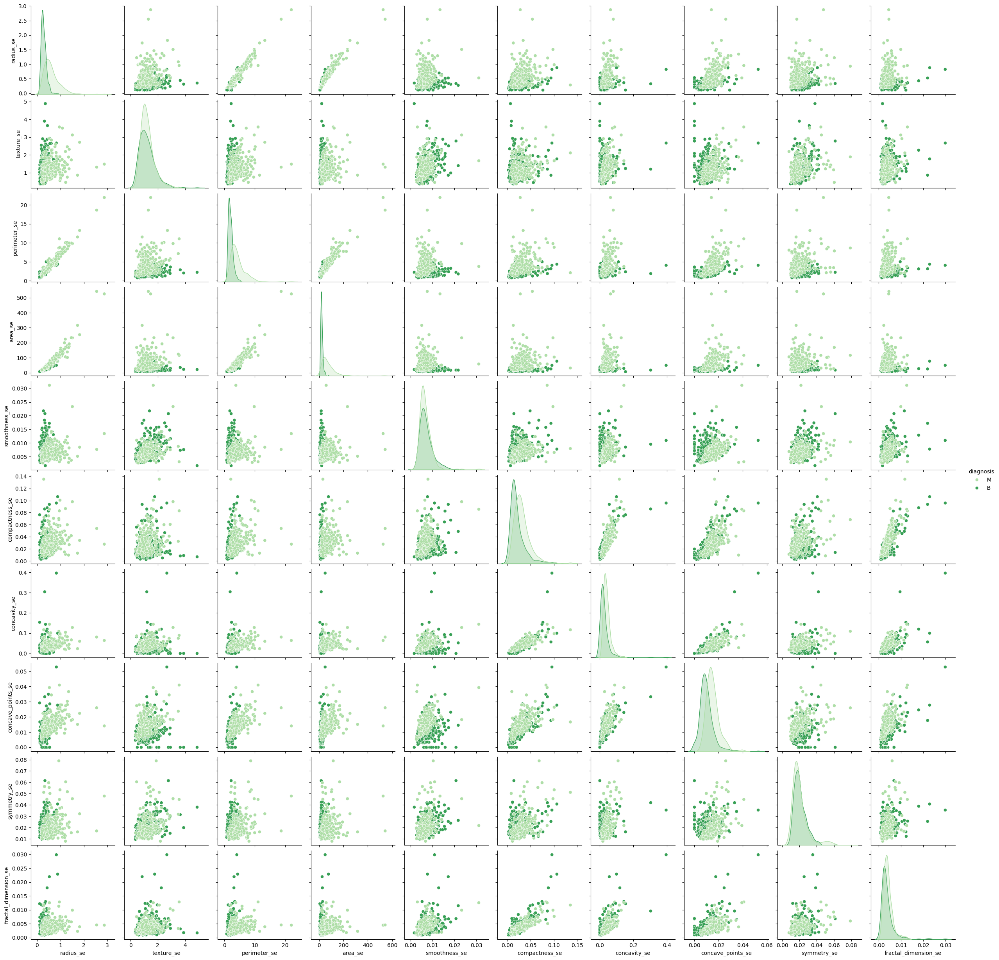

In [57]:
# pairplot for se columns
sns.pairplot(df[s_col],hue = 'diagnosis', palette='Greens')

## Interpretation:
The pairplot of the “standard error” variables shows substantial overlap between benign and malignant tumors. Although some variables such as radius_se, area_se, and perimeter_se exhibit a slightly stronger tendency in malignant tumors, the SE variables as a whole are generally less discriminative compared to the mean or worst columns. This implies that their contribution to the classification model is more limited.

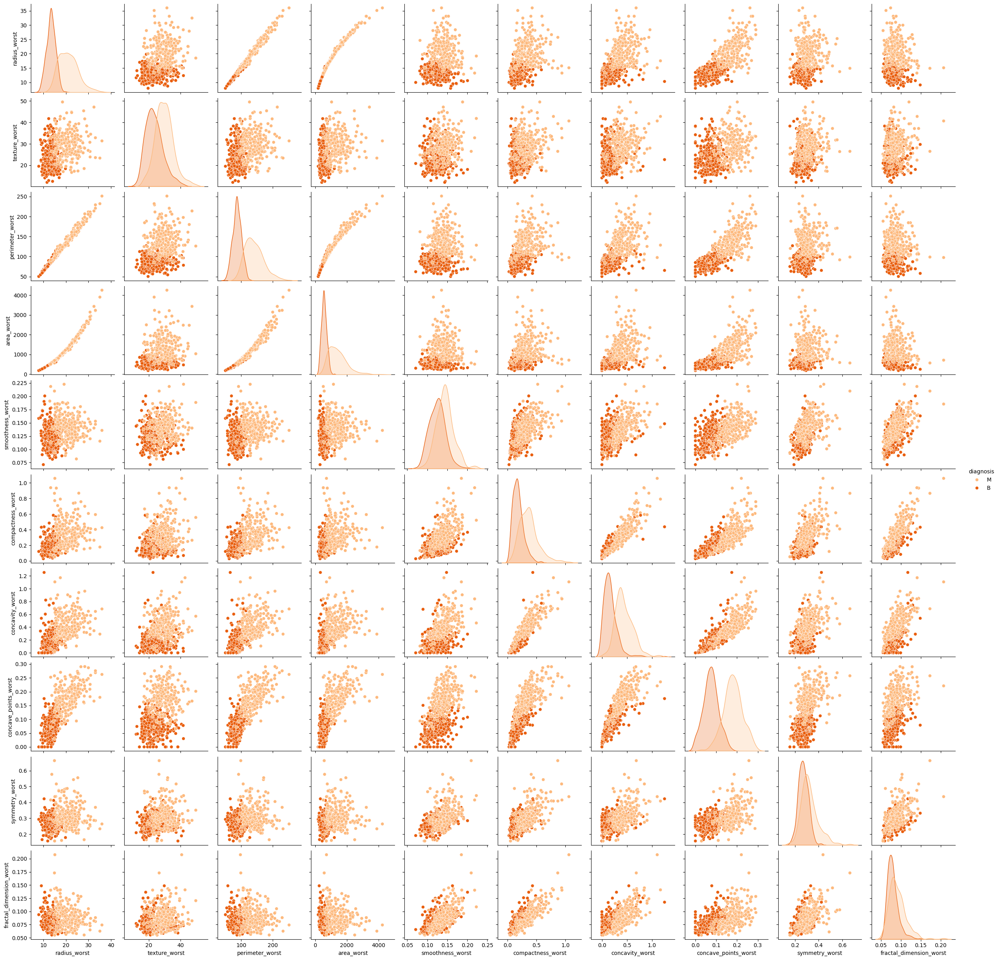

In [58]:
# pairplot for worst columns
sns.pairplot(df[w_col],hue = 'diagnosis', palette='Oranges')

## Interpretation:
 The pairplot of the _worst variables shows an especially clear separation between benign and malignant tumors.

Features such as radius_worst, perimeter_worst, area_worst, and especially concave_points_worst stand out for their strong discriminative power, with very little overlap between the classes.

These variables represent the most extreme shapes observed in the tumors and are therefore highly informative for classification. They constitute the most relevant features for training a model.

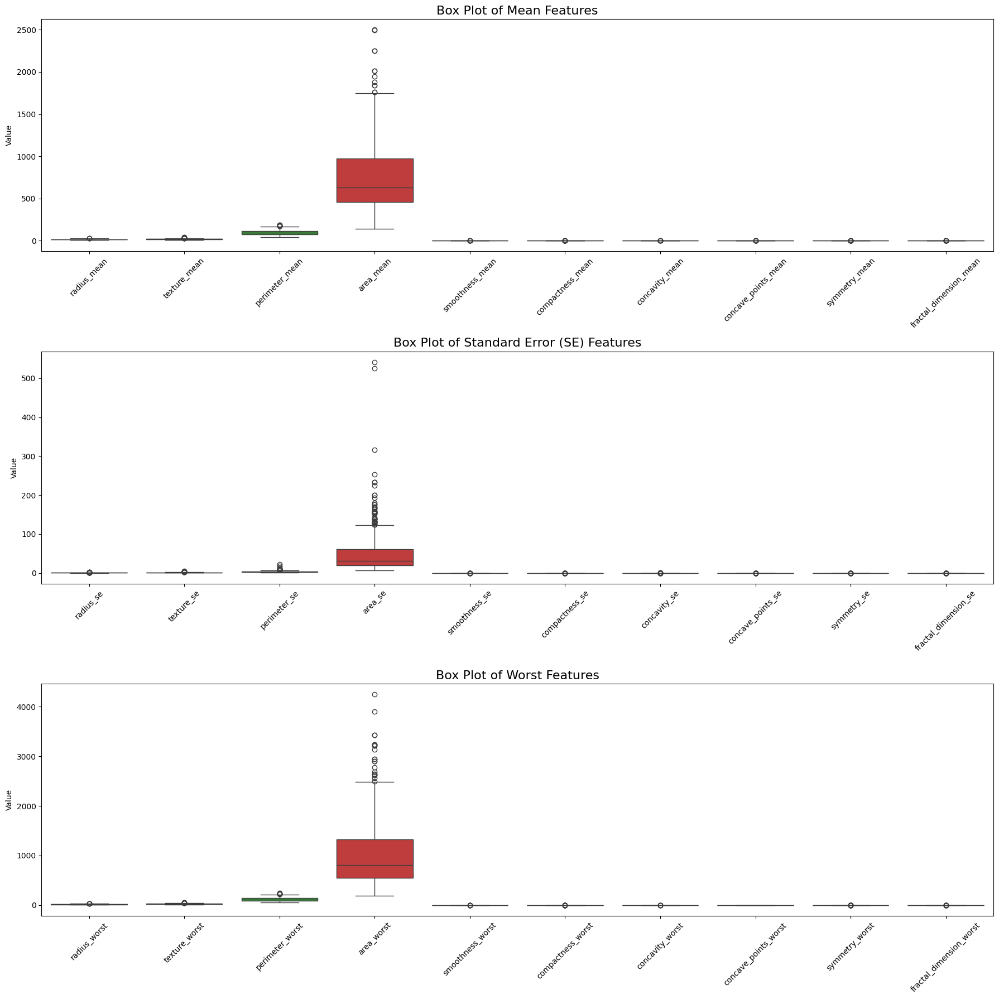

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
fig, axes = plt.subplots(3, 1, figsize=(18, 18))

sns.boxplot(
    data=df[m_col].drop(columns="diagnosis"),
    ax=axes[0]
)
axes[0].set_title("Box Plot of Mean Features", fontsize=16)
axes[0].set_ylabel("Value")
axes[0].tick_params(axis="x", rotation=45)


sns.boxplot(
    data=df[s_col].drop(columns="diagnosis"),
    ax=axes[1]
)
axes[1].set_title("Box Plot of Standard Error (SE) Features", fontsize=16)
axes[1].set_ylabel("Value")
axes[1].tick_params(axis="x", rotation=45)

sns.boxplot(
    data=df[w_col].drop(columns="diagnosis"),
    ax=axes[2]
)
axes[2].set_title("Box Plot of Worst Features", fontsize=16)
axes[2].set_ylabel("Value")
axes[2].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()


## Interpretation :
These distributions confirm that the dataset contains heterogeneous tumor profiles with varying levels of severity. Retaining outliers while applying standardization allows machine learning models to learn from clinically significant extreme cases without being dominated by scale effects. This understanding directly informed preprocessing choices and model selection in subsequent phases.

 ## Phase 3: Data Preparation
 Includes cleaning, encoding, scaling, feature engineering, and splitting datasets.

###  DSO Alignment
- **DSO1:** Proper scaling and cleaning prevent loss of signal needed for high recall.  
- **DSO2:** Removing noise improves precision by reducing false alarms.  
- **DSO4:** Good preprocessing improves model robustness across diverse tumor patterns.

###  Interpretation
Data preparation ensures the model:
- Learns true tumor patterns  
- Avoids artifacts that bias predictions  
- Can generalize well to new patient data  

This phase is essential for stable and clinically reliable models.


In [60]:
# drop 'Unnamed: 32' column if it exists (avoids KeyError and avoids assigning None)
if 'Unnamed: 32' in df.columns:
	df.drop('Unnamed: 32', axis=1, inplace=True)

In [61]:
# dropping id column if it exists to avoid KeyError
if 'id' in df.columns:
	df.drop('id', axis=1, inplace=True)

In [62]:
# mapping categorical values to numerical values
df['diagnosis']=df['diagnosis'].map({'B':0,'M':1})

In [63]:
df['diagnosis'].value_counts()

diagnosis
1    410
0    357
Name: count, dtype: int64

Variance expliquée par PC1: 44.45%
Variance expliquée par PC2: 18.85%
Variance totale expliquée (PC1+PC2): 63.30%


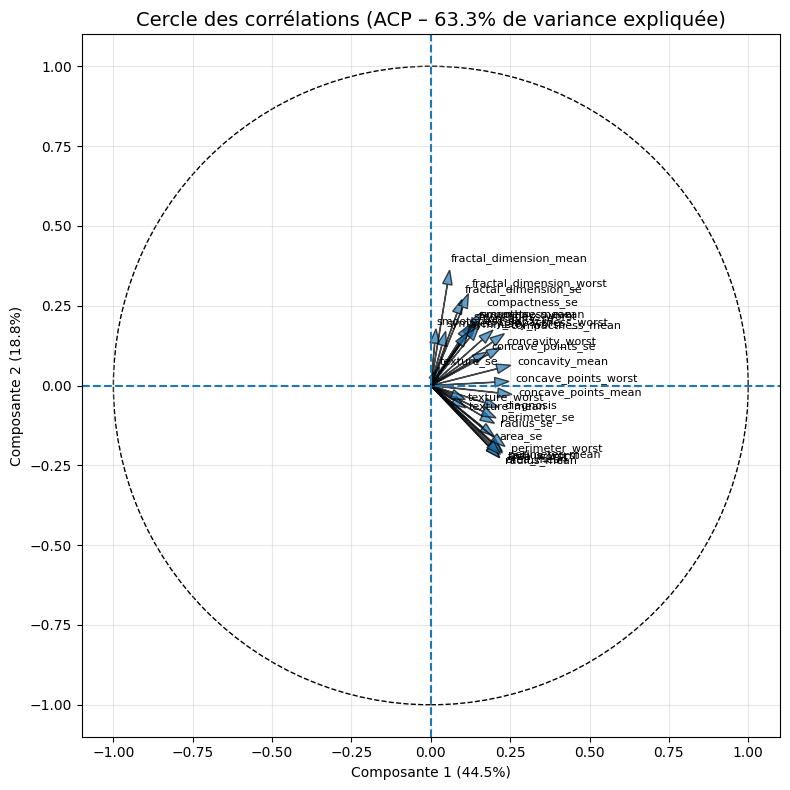

In [64]:

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


# Standardisation
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df)

# ACP (2 composantes principales)
pca = PCA(n_components=2, random_state=42)
pca.fit(X_scaled)

# Résultats
pcs = pca.components_
explained_var = pca.explained_variance_ratio_ * 100
total_var = explained_var.sum()
print(f"Variance expliquée par PC1: {explained_var[0]:.2f}%")
print(f"Variance expliquée par PC2: {explained_var[1]:.2f}%")
print(f"Variance totale expliquée (PC1+PC2): {total_var:.2f}%")

#Cercle des corrélations
plt.figure(figsize=(8,8))
plt.title(f"Cercle des corrélations (ACP – {total_var:.1f}% de variance expliquée)", fontsize=14)
plt.xlabel(f"Composante 1 ({explained_var[0]:.1f}%)")
plt.ylabel(f"Composante 2 ({explained_var[1]:.1f}%)")

# Cercle unité
circle = plt.Circle((0,0), 1, fill=False, linestyle='--')
plt.gca().add_artist(circle)

# Axes
plt.axhline(0, linestyle='--')
plt.axvline(0, linestyle='--')

#Flèches des variables
for i, (x, y) in enumerate(zip(pcs[0, :], pcs[1, :])):
    plt.arrow(0, 0, x, y, alpha=0.7, head_width=0.03, length_includes_head=True)
    plt.text(x*1.08, y*1.08, df.columns[i], fontsize=8)

#Limites & layout
plt.xlim(-1.1, 1.1)
plt.ylim(-1.1, 1.1)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


In [65]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

#Standardisation
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df)

#PCA (2 composantes principales)
pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

#Loadings (corrélation variable - composante)
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

# Calcul des cos²
# cos² = (loading^2)
squared_loadings = loadings**2
cos2 = squared_loadings / squared_loadings.sum(axis=1)[:, np.newaxis]

#Tableau final
cos2_df = pd.DataFrame(
    cos2,
    columns=[f"cos² PC{i+1}" for i in range(pca.n_components_)],
    index=df.columns
)

print("🔹 Tableau des cos² (qualité de représentation) :")
display(cos2_df.round(3))

#Variance expliquée
explained_var = pca.explained_variance_ratio_ * 100
print(f"\nVariance expliquée par PC1 : {explained_var[0]:.2f}%")
print(f"Variance expliquée par PC2 : {explained_var[1]:.2f}%")
print(f"Variance totale expliquée : {explained_var.sum():.2f}%")

🔹 Tableau des cos² (qualité de représentation) :


,cos² PC1,cos² PC2
diagnosis,0.959,0.041
radius_mean,0.687,0.313
texture_mean,0.854,0.146
perimeter_mean,0.737,0.263
area_mean,0.683,0.317
smoothness_mean,0.552,0.448
compactness_mean,0.827,0.173
concavity_mean,0.974,0.026
concave_points_mean,0.995,0.005
symmetry_mean,0.543,0.457



Variance expliquée par PC1 : 44.45%
Variance expliquée par PC2 : 18.85%
Variance totale expliquée : 63.30%


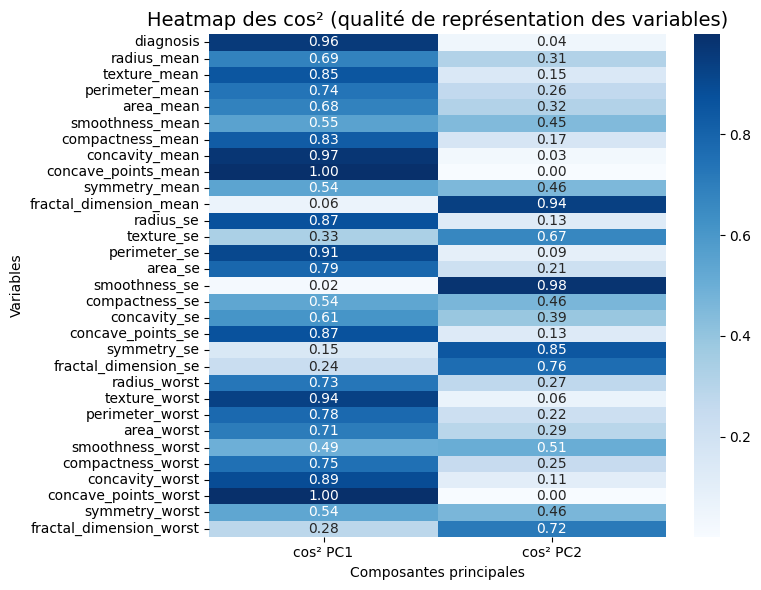

In [66]:
#Heatmap
plt.figure(figsize=(8,6))
sns.heatmap(cos2_df, annot=True, cmap="Blues", cbar=True, fmt=".2f")
plt.title("Heatmap des cos² (qualité de représentation des variables)", fontsize=14)
plt.ylabel("Variables")
plt.xlabel("Composantes principales")
plt.tight_layout()
plt.show()

## Interpretation: 
This heatmap displays how well each variable is represented by the first two principal components (PC1 and PC2) of a Principal Component Analysis (PCA). The values shown are cos² (squared cosine) scores:
- cos² PC1: How well the variable is represented by the first principal component.
- cos² PC2: How well the variable is represented by the second principal component.
Values range from 0 to 1:
- A value close to 1 means the variable is well represented by that component.
- A value close to 0 means the variable is poorly represented by that component.

## Top 10 Features (by cos² on PC1)

1. **concave_points_mean** (cos² ≈ 1.00)  
2. **concave_points_worst** (cos² ≈ 1.00)  
3. **concavity_mean** (cos² ≈ 0.97)  
4. **diagnosis** (cos² ≈ 0.96)  
5. **texture_worst** (cos² ≈ 0.94)  
6. **perimeter_se** (cos² ≈ 0.91)  
7. **concavity_worst** (cos² ≈ 0.89)  
8. **radius_se** (cos² ≈ 0.87)  
9. **concave_points_se** (cos² ≈ 0.87)  
10. **texture_mean** (cos² ≈ 0.85)  



In [ ]:
from sklearn.model_selection import train_test_split

# Prepare Data
X = df.drop('diagnosis', axis=1)
y = df['diagnosis']

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [87]:
import joblib, os
os.makedirs("../artifacts", exist_ok=True)
joblib.dump(scaler, "../artifacts/scaler.joblib")


['../artifacts/scaler.joblib']

# Phase 4: Modeling

In this phase, we implement and evaluate the 6 models defined in the benchmark table:
1. Linear Regression
2. Softmax Regression
3. k-NN (L1NN - L2NN)
4. Linear SVM
5. MLP (500-500-500)
6. GRU-SVM (Proxy)
7. Random Forest


In [68]:
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score

# Model 1: K-NN

In [69]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

param_grid_L1 = {
    "n_neighbors": list(range(1, 31)),
    "weights": ["uniform", "distance"],
    "metric": ["manhattan"]
}

grid_L1 = GridSearchCV(
    KNeighborsClassifier(),
    param_grid_L1,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)
grid_L1.fit(X_train_scaled, y_train)

L1nn_model = grid_L1.best_estimator_
print("L1NN best params:", grid_L1.best_params_)
print("L1NN best CV accuracy:", grid_L1.best_score_)

# Prediction
y_pred_L1nn = L1nn_model.predict(X_test_scaled)



param_grid_L2 = {
    "n_neighbors": list(range(1, 31)),
    "weights": ["uniform", "distance"],
    "metric": ["euclidean"] 
}

grid_L2 = GridSearchCV(
    KNeighborsClassifier(),
    param_grid_L2,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)
grid_L2.fit(X_train_scaled, y_train)

L2nn_model = grid_L2.best_estimator_
print("L2NN best params:", grid_L2.best_params_)
print("L2NN best CV accuracy:", grid_L2.best_score_)

# Prediction
y_pred_L2nn = L2nn_model.predict(X_test_scaled)


L1NN best params: {'metric': 'manhattan', 'n_neighbors': 18, 'weights': 'distance'}
L1NN best CV accuracy: 0.9738490827275873
L2NN best params: {'metric': 'euclidean', 'n_neighbors': 16, 'weights': 'distance'}
L2NN best CV accuracy: 0.9682416060920733


# Model 2: SoftmaxRegression

In [70]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

elastic_logit = LogisticRegression(
    penalty="elasticnet",
    solver="saga",
    max_iter=5000,
    random_state=42
)

param_grid_elastic = {
    "C": [0.01, 0.1, 1, 10, 100],
    "l1_ratio": [0.1, 0.3, 0.5, 0.7, 0.9]
}

grid_elastic = GridSearchCV(
    elastic_logit,
    param_grid_elastic,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)

grid_elastic.fit(X_train_scaled, y_train)

softmax_elastic_model = grid_elastic.best_estimator_
print("ElasticNet Logistic best params:", grid_elastic.best_params_)
print("ElasticNet Logistic best CV accuracy:", grid_elastic.best_score_)

# Predict (Modeling)
y_pred_softmax_elastic = softmax_elastic_model.predict(X_test_scaled)


ElasticNet Logistic best params: {'C': 0.1, 'l1_ratio': 0.1}
ElasticNet Logistic best CV accuracy: 0.9645205953617169


# Model 3 : LinearRegression 

In [71]:
from sklearn.linear_model import LinearRegression

lin_reg_model = LinearRegression()
lin_reg_model.fit(X_train_scaled, y_train)
lin_pred_raw = lin_reg_model.predict(X_test_scaled)
y_pred_lin = (lin_pred_raw >= 0.5).astype(int)



# Model 4 : Linear SVM

In [72]:
from sklearn.svm import LinearSVC
from sklearn.model_selection import GridSearchCV

linear_svm = LinearSVC(random_state=42, max_iter=10000)

grid_linear_svm = GridSearchCV(
    linear_svm,
    {"C": [0.001, 0.01, 0.1, 1, 10, 100]},
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)

grid_linear_svm.fit(X_train_scaled, y_train)

linear_svm_tuned = grid_linear_svm.best_estimator_
print("Linear SVM best C:", grid_linear_svm.best_params_)
print("Linear SVM best CV accuracy:", grid_linear_svm.best_score_)

# Predict (Modeling)
y_pred_svm_lin_tuned = linear_svm_tuned.predict(X_test_scaled)


Linear SVM best C: {'C': 0.01}
Linear SVM best CV accuracy: 0.9626514364832122


# Model 5 : MLPClassifier 

In [73]:
from sklearn.neural_network import MLPClassifier
mlp_es = MLPClassifier(
    hidden_layer_sizes=(500, 500, 500),
    max_iter=2000,
    random_state=0,
    early_stopping=True,
    validation_fraction=0.1,
    n_iter_no_change=20,
    tol=1e-4
)

mlp_es.fit(X_train_scaled, y_train)

# Prediction (Modeling phase)
y_pred_mlp_es = mlp_es.predict(X_test_scaled)

print("MLP (early stopping) iterations:", mlp_es.n_iter_)
print("Best validation score:", mlp_es.best_validation_score_)


MLP (early stopping) iterations: 24
Best validation score: 0.9814814814814815


# Model 6 : GRU-SVM (Proxy)

In [74]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

rbf_svm = SVC(kernel="rbf", random_state=42)

param_grid_rbf = {
    "C": [0.1, 1, 10, 100],
    "gamma": ["scale", 0.001, 0.01, 0.1, 1.0]
}

grid_rbf = GridSearchCV(
    rbf_svm,
    param_grid_rbf,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)

grid_rbf.fit(X_train_scaled, y_train)

gru_svm_proxy_tuned = grid_rbf.best_estimator_
print("RBF SVM (GRU-SVM Proxy) best params:", grid_rbf.best_params_)
print("RBF SVM best CV accuracy:", grid_rbf.best_score_)

# Predict
y_pred_gru_svm_proxy_tuned = gru_svm_proxy_tuned.predict(X_test_scaled)


RBF SVM (GRU-SVM Proxy) best params: {'C': 10, 'gamma': 0.01}
RBF SVM best CV accuracy: 0.9701107649705779


# Model 7 : RandomForestClassifier

In [75]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(n_estimators=200, random_state=42)
rf_model.fit(X_train_scaled, y_train)
y_pred_rf = rf_model.predict(X_test_scaled)




## Phase 5 : Evaluation


In [76]:

import pandas as pd
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score

def compute_metrics_row(model_name, y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    accuracy = accuracy_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)  # TPR
    selectivity = tn / (tn + fp) if (tn + fp) else 0.0
    fall_out = fp / (fp + tn) if (fp + tn) else 0.0
    fnr = fn / (fn + tp) if (fn + tp) else 0.0

    return {
        "Model": model_name,
        "Accuracy": round(accuracy, 4),
        "Recall (TPR)": round(recall, 4),
        "Selectivity (TNR)": round(selectivity, 4),
        "Fall-out (FPR)": round(fall_out, 4),
        "FNR": round(fnr, 4)
    }

rows = []

rows.append(compute_metrics_row("Linear Regression", y_test, y_pred_lin))
rows.append(compute_metrics_row("L1NN (Manhattan)", y_test, y_pred_L1nn))
rows.append(compute_metrics_row("L2NN (Euclidean)", y_test, y_pred_L2nn))
rows.append(compute_metrics_row("MLP (early stopping)", y_test, y_pred_mlp_es))
rows.append(compute_metrics_row("Random Forest", y_test, y_pred_rf))
rows.append(compute_metrics_row("Softmax (ElasticNet)", y_test, y_pred_softmax_elastic))
rows.append(compute_metrics_row("Linear SVM (C tuned)", y_test, y_pred_svm_lin_tuned))
rows.append(compute_metrics_row("GRU-SVM Proxy (RBF tuned)", y_test, y_pred_gru_svm_proxy_tuned))
final_results_df = pd.DataFrame(rows)
final_results_df


,Model,Accuracy,Recall (TPR),Selectivity (TNR),Fall-out (FPR),FNR
0,Linear Regression,0.9870,0.9756,1.0000,0.0000,0.0244
1,L1NN (Manhattan),0.9870,0.9919,0.9815,0.0185,0.0081
2,L2NN (Euclidean),0.9957,1.0000,0.9907,0.0093,0.0000
3,MLP (early stopping),0.9870,0.9837,0.9907,0.0093,0.0163
4,Random Forest,0.9913,0.9919,0.9907,0.0093,0.0081
5,Softmax (ElasticNet),0.9913,0.9919,0.9907,0.0093,0.0081
6,Linear SVM (C tuned),0.9913,0.9837,1.0000,0.0000,0.0163
7,GRU-SVM Proxy (RBF tuned),0.9870,0.9756,1.0000,0.0000,0.0244


| **Model**                               | **Primary DSO(s) Covered**                         | **Why It Supports These DSOs**                                                                                          | **Clinical Interpretation**                                                                                              |
| --------------------------------------- | -------------------------------------------------- | ----------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------ |
| **ElasticNet Logistic Regression**      | **DSO3** (fast & interpretable) <br> *DSO2 (weak)* | - Sparse and interpretable coefficients (L1 + L2)<br>- Calibrated probability outputs<br>- Extremely fast at inference | - Lower Recall → not ideal for early detection (DSO1)<br>- Good Selectivity → fewer false alarms (DSO2)                  |
| **Random Forest**                       | **DSO1**, **DSO2**, **DSO4**                       | - Strong non-linear feature separation<br>- Ensemble reduces variance & false positives<br>- Robust to noise           | - High Recall → supports early cancer detection<br>- Good Selectivity → fewer unnecessary biopsies                       |
| **Linear / RBF SVM (C & γ tuned)**      | **DSO1**, **DSO2**, **DSO4**                       | - Margin maximization with tuned regularization<br>- Strong generalization on standardized data                         | - High Recall → effective for early detection<br>- Limited interpretability → weaker for DSO3                            |
| **L1NN / L2NN (Manhattan / Euclidean)** | **DSO2**, **DSO4** *(distance-dependent)*          | - Simple, non-parametric approach<br>- High Selectivity with optimized K and distance metric                           | - High Selectivity → reduces unnecessary tests (DSO2)<br>- Sensitive to noise → weaker robustness (DSO4)                |
| **MLP (500-500-500, Early Stopping)**   | **DSO1**, **DSO4**                                 | - Learns complex non-linear patterns<br>- Early stopping improves generalization and reduces overfitting               | - High Recall potential → supports early detection<br>- Poor interpretability → not suitable for DSO3                   |


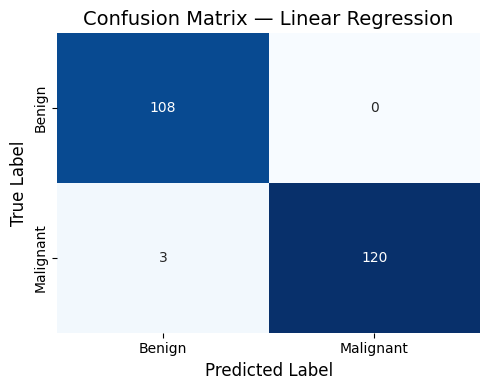

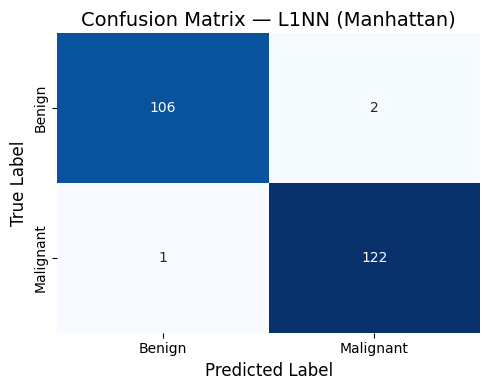

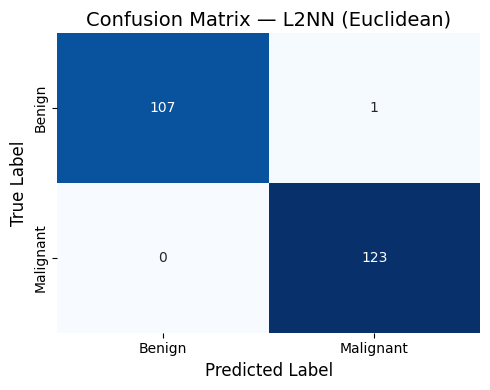

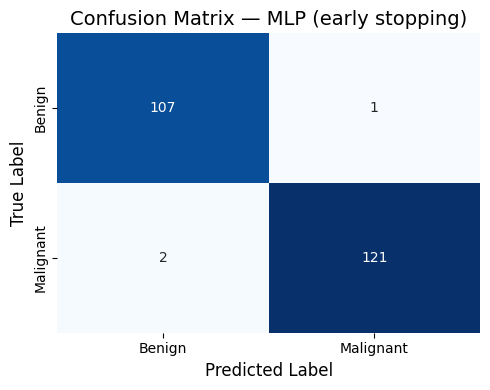

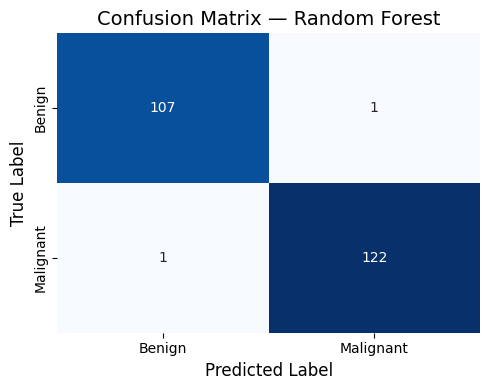

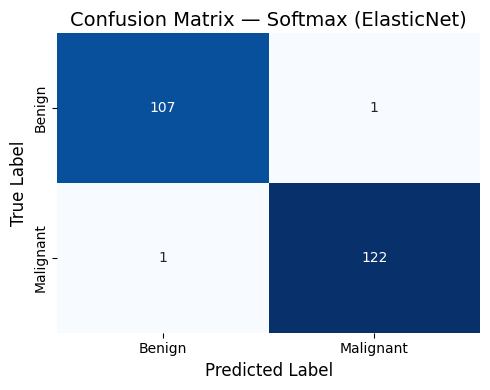

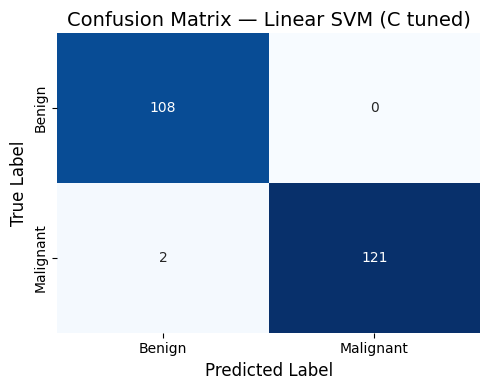

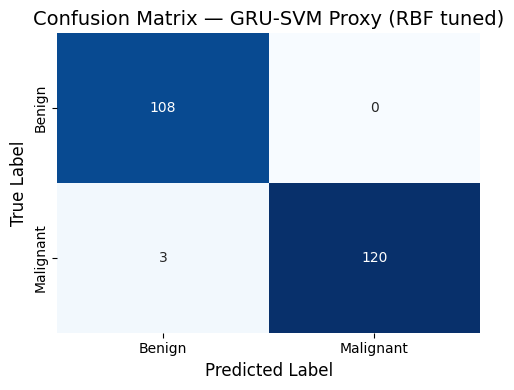

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

models_preds = {
    "Linear Regression": y_pred_lin,
    "L1NN (Manhattan)": y_pred_L1nn,
    "L2NN (Euclidean)": y_pred_L2nn,
    "MLP (early stopping)": y_pred_mlp_es,
    "Random Forest": y_pred_rf,
    "Softmax (ElasticNet)": y_pred_softmax_elastic,
    "Linear SVM (C tuned)": y_pred_svm_lin_tuned,
    "GRU-SVM Proxy (RBF tuned)": y_pred_gru_svm_proxy_tuned
}


for model_name, y_pred in models_preds.items():
    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(5, 4))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        cbar=False,
        xticklabels=["Benign", "Malignant"],
        yticklabels=["Benign", "Malignant"]
    )

    plt.title(f"Confusion Matrix — {model_name}", fontsize=14)
    plt.xlabel("Predicted Label", fontsize=12)
    plt.ylabel("True Label", fontsize=12)

    plt.tight_layout()
    plt.show()


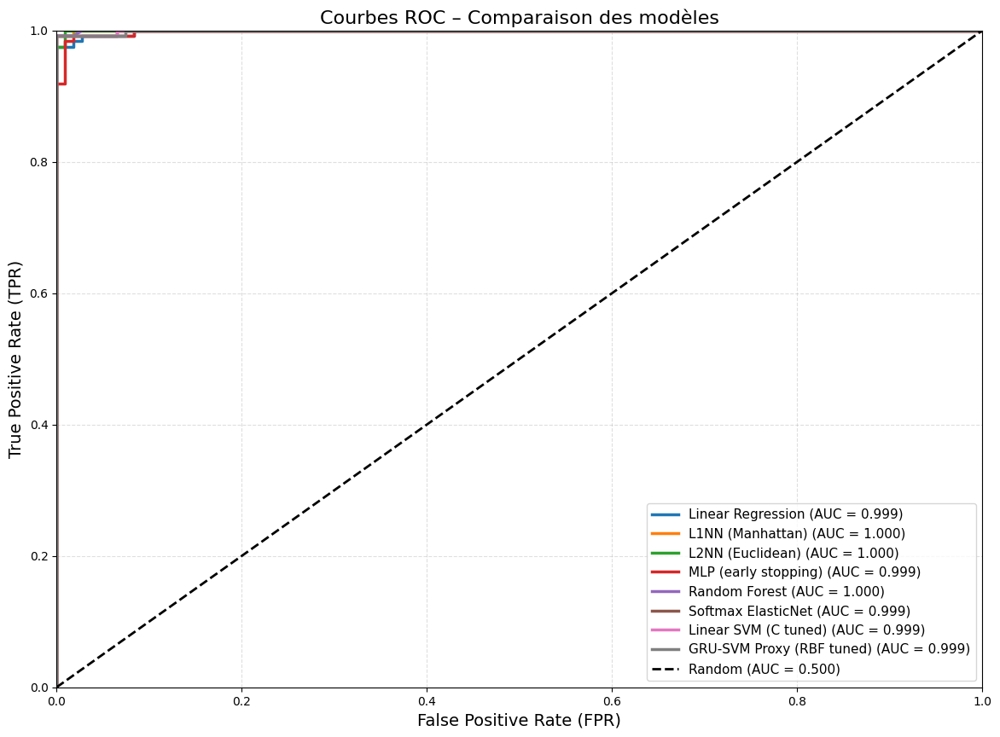

In [78]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 10))
lw = 2.5

def plot_roc(name, y_true, y_score):
    y_score = np.asarray(y_score).ravel()
    fpr, tpr, _ = roc_curve(y_true, y_score)
    plt.plot(fpr, tpr, lw=lw, label=f"{name} (AUC = {auc(fpr, tpr):.3f})")


y_score_lin = lin_reg_model.predict(X_test_scaled)
plot_roc("Linear Regression", y_test, y_score_lin)


y_score_L1 = L1nn_model.predict_proba(X_test_scaled)[:, 1]
plot_roc("L1NN (Manhattan)", y_test, y_score_L1)


y_score_L2 = L2nn_model.predict_proba(X_test_scaled)[:, 1]
plot_roc("L2NN (Euclidean)", y_test, y_score_L2)


y_score_mlp_es = mlp_es.predict_proba(X_test_scaled)[:, 1]
plot_roc("MLP (early stopping)", y_test, y_score_mlp_es)


y_score_rf = rf_model.predict_proba(X_test_scaled)[:, 1]
plot_roc("Random Forest", y_test, y_score_rf)


y_score_softmax_elastic = softmax_elastic_model.predict_proba(X_test_scaled)[:, 1]
plot_roc("Softmax ElasticNet", y_test, y_score_softmax_elastic)


y_score_svm_lin_tuned = linear_svm_tuned.decision_function(X_test_scaled)
plot_roc("Linear SVM (C tuned)", y_test, y_score_svm_lin_tuned)


y_score_gru_svm_proxy = gru_svm_proxy_tuned.decision_function(X_test_scaled)
plot_roc("GRU-SVM Proxy (RBF tuned)", y_test, y_score_gru_svm_proxy)

plt.plot([0, 1], [0, 1], "k--", lw=2, label="Random (AUC = 0.500)")

plt.xlim([0, 1])
plt.ylim([0, 1])
plt.title("Courbes ROC – Comparaison des modèles", fontsize=16)
plt.xlabel("False Positive Rate (FPR)", fontsize=14)
plt.ylabel("True Positive Rate (TPR)", fontsize=14)
plt.grid(True, linestyle="--", alpha=0.4)
plt.legend(loc="lower right", fontsize=11)

plt.show()


## Interpretation:
All the models have excellent ROC performance, with AUC values between about 0.996 and 1.000, which means they almost perfectly separate benign from malignant tumors.​
Because several curves are nearly identical and very close to the top‑left corner, the choice between models should focus more on interpretability, speed, and robustness than on AUC alone.

In [79]:
import lime
import lime.lime_tabular
import shap
import warnings
warnings.filterwarnings('ignore')
shap.initjs()

In [80]:
import lime
import lime.lime_tabular
from IPython.display import display, HTML

# Select the model to explain
model_to_explain = rf_model

# Feature names
feature_names_list = list(X.columns)

# Initialize LIME Explainer
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=feature_names_list,
    class_names=['Benign', 'Malignant'],
    mode='classification'
)

# Explain a specific instance
idx = 7
print(f"Explaining prediction for test instance {idx}")
print(f"True label: {'Malignant' if y_test.iloc[idx] == 1 else 'Benign'}")
print(
    f"Predicted label: "
    f"{'Malignant' if model_to_explain.predict(X_test_scaled[idx:idx+1])[0] == 1 else 'Benign'}"
)
print("\nLIME Explanation:")

# Generate explanation
exp = explainer_lime.explain_instance(
    data_row=X_test_scaled[idx],
    predict_fn=model_to_explain.predict_proba,
    num_features=10
)


html = exp.as_html()
html = f"""
<div style="background-color:white; color:black; padding:20px;">
    {html}
</div>
"""

display(HTML(html))

Explaining prediction for test instance 7
True label: Benign
Predicted label: Benign

LIME Explanation:



This LIME plot explains why the model predicted “Benign” for this specific test patient.
The probability bar on the left shows predicted probabilities of about 0.82 for Benign and 0.18 for Malignant, indicating that the model is confident in a benign diagnosis.
On the right, the blue bars represent features that push the prediction toward Benign (e.g., lower values of area_worst, perimeter_worst, radius_worst, concavity_worst, concave_points_worst, area_mean, and area_se), while the orange bars are features that slightly push the prediction toward Malignant (mainly texture_worst and texture_mean).
Overall, size- and shape-related features (area, radius, and perimeter, both “worst” and “mean”) have low standardized values for this instance and dominate the explanation, outweighing the influence of texture-related features. This leads the model to classify the tumor as benign.


In [81]:
# Initialize SHAP TreeExplainer for Random Forest
print("Computing SHAP values (this may take a moment)...")
explainer_shap = shap.TreeExplainer(model_to_explain)
shap_values_raw = explainer_shap.shap_values(X_test_scaled)

# Handle different SHAP output formats for binary classification
if isinstance(shap_values_raw, list):
    # Format 1: List of arrays [class_0_values, class_1_values]
    shap_values_class1 = shap_values_raw[1]
    base_value = explainer_shap.expected_value[1] if isinstance(explainer_shap.expected_value, (list, np.ndarray)) else explainer_shap.expected_value
elif len(shap_values_raw.shape) == 3:
    # Format 2: 3D array (n_samples, n_features, n_classes)
    shap_values_class1 = shap_values_raw[:, :, 1]
    base_value = explainer_shap.expected_value[1]
else:
    # Format 3: 2D array - already for single class
    shap_values_class1 = shap_values_raw
    base_value = explainer_shap.expected_value if not isinstance(explainer_shap.expected_value, (list, np.ndarray)) else explainer_shap.expected_value[0]

print(f"SHAP values computed successfully!")
print(f"Shape: {shap_values_class1.shape}")
print(f"Base value: {base_value}")

Computing SHAP values (this may take a moment)...
SHAP values computed successfully!
Shape: (231, 30)
Base value: 0.5336473880597012


Global Feature Importance (Summary Plot):
This plot shows which features are most important across all predictions.



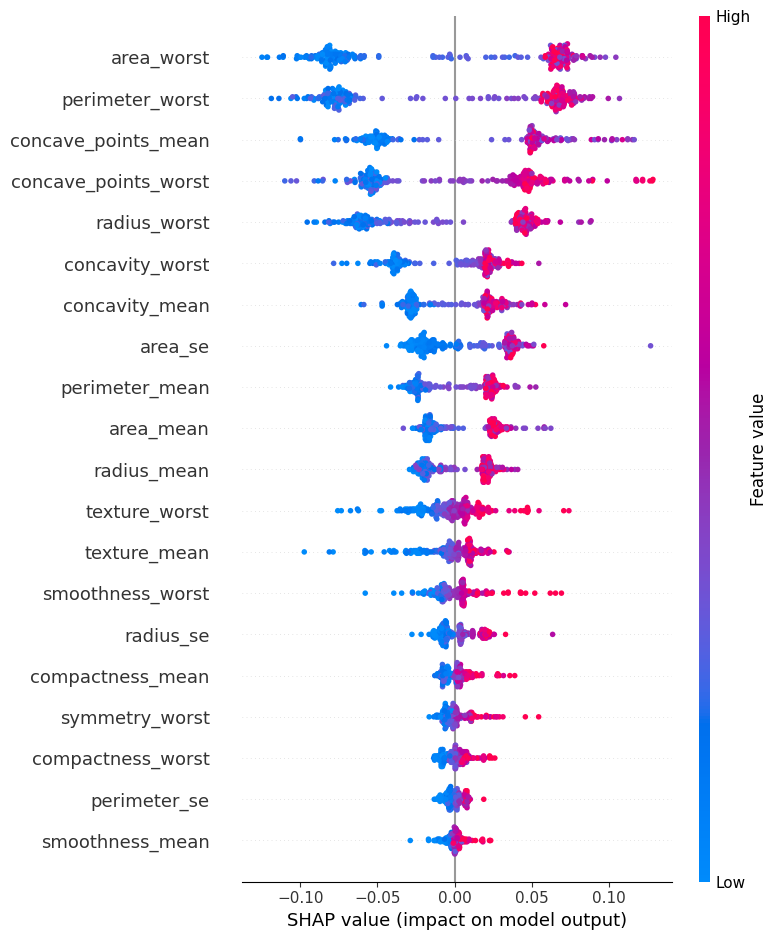

In [82]:
# Summary Plot
print("Global Feature Importance (Summary Plot):")
print("This plot shows which features are most important across all predictions.\n")

shap.summary_plot(
    shap_values_class1, 
    X_test_scaled, 
    feature_names=feature_names_list,
    show=True
)

## Interpretation:
This SHAP summary plot shows, for the whole dataset, which features drive the model toward “malignant” (right) or “benign” (left) and how strong their impact is.​
Features at the top (like area_worst, concave_points_worst, concave_points_mean, perimeter_worst, radius_worst) have the largest global impact on the prediction; lower features matter less.​
Red dots are high feature values, blue dots are low values. Red points mostly on the right mean “high values push toward malignant”, while red points on the left (rare here) would push toward benign. In your plot, large area, radius, perimeter and concavity measures clearly increase the malignancy score, while low values of these features push predictions toward benign.


 ## Phase 6: Deployment


In [89]:
import os, json
import numpy as np
from pathlib import Path

from sklearn.metrics import (
    confusion_matrix, accuracy_score, precision_score, recall_score, f1_score,
    roc_curve, auc
)

# ============ paths ============
ARTIFACTS_DIR = os.path.join("..", "artifacts")
os.makedirs(ARTIFACTS_DIR, exist_ok=True)

OUT_REPORT   = os.path.join(ARTIFACTS_DIR, "evaluation_report.json")
OUT_TABLE    = os.path.join(ARTIFACTS_DIR, "evaluation_table.json")
OUT_FEAT_IMP = os.path.join(ARTIFACTS_DIR, "feature_importance.json")
OUT_LIME     = os.path.join(ARTIFACTS_DIR, "lime_explanations.json")
OUT_SHAP_SUM = os.path.join(ARTIFACTS_DIR, "shap_summary.json")

SHAP_DIR = os.path.join(ARTIFACTS_DIR, "shap_summary")
os.makedirs(SHAP_DIR, exist_ok=True)

def safe_json_dump(obj, path):
    with open(path, "w", encoding="utf-8") as f:
        json.dump(obj, f, indent=2)

# ============ helpers ============
def to01(y):
    y = np.asarray(y).ravel()
    if y.dtype.kind in ("U", "S", "O"):
        y = np.where(np.isin(y, ["M", "malignant", "Malignant", "1"]), 1, 0)
    return y.astype(int)

def get_score(model, X):
    if hasattr(model, "predict_proba"):
        try:
            p = np.asarray(model.predict_proba(X))
            if p.ndim == 2 and p.shape[1] >= 2:
                return p[:, 1]
        except Exception:
            pass
    if hasattr(model, "decision_function"):
        try:
            return np.asarray(model.decision_function(X)).ravel()
        except Exception:
            pass
    return None

def eval_one(model_id, model_name, model, X_test_scaled, y_test):
    y_true = to01(y_test)
    y_pred = to01(model.predict(X_test_scaled))

    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()

    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec  = recall_score(y_true, y_pred, zero_division=0)
    f1v  = f1_score(y_true, y_pred, zero_division=0)

    specificity = tn / (tn + fp) if (tn + fp) else 0.0
    fnr = fn / (fn + tp) if (fn + tp) else 0.0

    row = {
        "model_id": model_id,
        "model_name": model_name,
        "accuracy": float(acc),
        "precision": float(prec),
        "recall": float(rec),
        "specificity": float(specificity),
        "fnr": float(fnr),
        "f1": float(f1v),
        "auc": None,
        "tn": int(tn), "fp": int(fp), "fn": int(fn), "tp": int(tp),
    }

    roc_obj = None
    s = get_score(model, X_test_scaled)
    if s is not None:
        s = np.asarray(s).ravel()
        if np.unique(s).size > 1:
            fpr, tpr, _ = roc_curve(y_true, s)
            auc_val = float(auc(fpr, tpr))
            row["auc"] = auc_val
            roc_obj = {"fpr": [float(x) for x in fpr], "tpr": [float(x) for x in tpr], "auc": auc_val}

    return row, roc_obj

def normalize_importances(v):
    v = np.asarray(v, dtype=float).ravel()
    v = np.nan_to_num(v, nan=0.0, posinf=0.0, neginf=0.0)
    s = v.sum()
    if s > 0:
        v = v / s
    return v.tolist()

# ============ load feature names ============
feat_csv = os.path.join(ARTIFACTS_DIR, "feature_names.csv")
if not os.path.exists(feat_csv):
    raise RuntimeError(f"feature_names.csv missing at: {os.path.abspath(feat_csv)}")

with open(feat_csv, "r", encoding="utf-8") as f:
    feature_names_list = [line.strip() for line in f.readlines() if line.strip()]

# ============ DEPLOYED MODELS ONLY ============
models_map = [
    ("k-nn_(optimized)", "L2NN (Euclidean)", L2nn_model),
    ("random_forest", "Random Forest", rf_model),
]

# ============ evaluation report ============
y_true = to01(y_test)

rows = []
roc = {}
for model_id, model_name, model in models_map:
    r, roc_obj = eval_one(model_id, model_name, model, X_test_scaled, y_test)
    rows.append(r)
    if roc_obj is not None:
        roc[model_id] = roc_obj

def rank_key(r):
    return (r["fnr"], -(r["auc"] if r["auc"] is not None else -1))

rows_sorted = sorted(rows, key=rank_key)
recommended = rows_sorted[0]["model_id"] if rows_sorted else None

report = {
    "source": "notebook:X_test_scaled,y_test",
    "split": {"test_size": 0.3, "random_state": 42, "stratify": True},
    "n_test": int(len(y_true)),
    "positive_rate_test": float(np.mean(y_true)),
    "recommended_model_id": recommended,
    "rows": rows_sorted,
    "roc": roc,
}

safe_json_dump(report, OUT_REPORT)
safe_json_dump(rows_sorted, OUT_TABLE)

print("✅ Wrote:", os.path.abspath(OUT_REPORT))
print("✅ Wrote:", os.path.abspath(OUT_TABLE))
print("📌 Recommended model:", recommended)

# ============ Feature Importance (ONLY RandomForest) ============
feature_importance = {}
for model_id, model_name, model in models_map:
    if model_id != "random_forest":
        feature_importance[model_id] = {
            "message": "No intrinsic feature importance for this model. Use SHAP instead.",
            "features": [],
            "importances": []
        }
        continue

    imp = None
    if hasattr(model, "feature_importances_"):
        imp = normalize_importances(model.feature_importances_)
    elif hasattr(model, "coef_"):
        coef = np.asarray(model.coef_)
        if coef.ndim == 2:
            coef = np.mean(np.abs(coef), axis=0)
        else:
            coef = np.abs(coef).ravel()
        imp = normalize_importances(coef)
    else:
        imp = []

    feature_importance[model_id] = {
        "features": feature_names_list,
        "importances": imp
    }

safe_json_dump(feature_importance, OUT_FEAT_IMP)
print("✅ Wrote:", os.path.abspath(OUT_FEAT_IMP))

# ============ LIME (compute + export here so it never disappears) ============
lime_explanations = {}

try:
    import lime
    import lime.lime_tabular

    X_train_np = np.asarray(X_train_scaled)
    X_test_np  = np.asarray(X_test_scaled)
    y_test_np  = to01(y_test)

    explainer = lime.lime_tabular.LimeTabularExplainer(
        training_data=X_train_np,
        feature_names=feature_names_list,
        class_names=["Benign", "Malignant"],
        mode="classification",
        discretize_continuous=True
    )

    # choose how many test samples you want to cache for the dashboard
    MAX_SAMPLES = 50
    sample_indices = list(range(min(MAX_SAMPLES, len(X_test_np))))

    for model_id, model_name, model in models_map:
        lime_explanations[model_id] = {}

        # LIME needs predict_proba
        if not hasattr(model, "predict_proba"):
            lime_explanations[model_id]["_note"] = "Model has no predict_proba; LIME requires probabilities."
            continue

        for idx in sample_indices:
            exp = explainer.explain_instance(
                data_row=X_test_np[idx],
                predict_fn=model.predict_proba,
                num_features=12
            )

            # exp.as_list(): list of (feature_rule_string, weight)
            weights = dict(exp.as_list())

            proba = model.predict_proba(X_test_np[idx:idx+1])[0]
            pred = int(np.argmax(proba))
            conf = float(np.max(proba))

            lime_explanations[model_id][str(idx)] = {
                "prediction": pred,
                "probability": conf,
                "feature_weights": weights
            }

except Exception as e:
    lime_explanations["_error"] = f"LIME failed: {e}"

safe_json_dump(lime_explanations, OUT_LIME)
print("✅ Wrote:", os.path.abspath(OUT_LIME))

# ============ SHAP summary PNG per model ============
shap_summary = {}

import shap
import matplotlib.pyplot as plt

# background for SHAP (small for speed)
bg = np.asarray(X_train_scaled)
bg = bg[:200] if len(bg) > 200 else bg

X_explain = np.asarray(X_test_scaled)
X_sub = X_explain[:300] if len(X_explain) > 300 else X_explain

for model_id, model_name, model in models_map:
    out_png = os.path.join(SHAP_DIR, f"{model_id}_summary.png")

    try:
        # Better explainer for RF
        if model_id == "random_forest":
            explainer = shap.TreeExplainer(model)
            sv = explainer.shap_values(X_sub)
            # For binary classifiers, shap_values may be list [class0, class1]
            if isinstance(sv, list) and len(sv) > 1:
                sv_plot = sv[1]
            else:
                sv_plot = sv

            plt.figure()
            shap.summary_plot(sv_plot, X_sub, feature_names=feature_names_list, show=False)
            plt.savefig(out_png, dpi=150, bbox_inches="tight")
            plt.close()
        else:
            # Model-agnostic for k-NN
            if hasattr(model, "predict_proba"):
                f = lambda X: model.predict_proba(X)[:, 1]
            else:
                f = lambda X: model.predict(X)

            explainer = shap.PermutationExplainer(f, bg)
            sv = explainer(X_sub)

            plt.figure()
            shap.summary_plot(sv, X_sub, feature_names=feature_names_list, show=False)
            plt.savefig(out_png, dpi=150, bbox_inches="tight")
            plt.close()

        shap_summary[model_id] = {
            "plot_file": os.path.basename(out_png),
            "description": f"Global SHAP summary for {model_name}."
        }
        print(f"✅ SHAP saved: {out_png}")

    except Exception as e:
        shap_summary[model_id] = {
            "plot_file": None,
            "description": f"Failed to compute SHAP for {model_name}: {e}"
        }
        print(f"⚠️ SHAP failed for {model_id}: {e}")

safe_json_dump(shap_summary, OUT_SHAP_SUM)
print("✅ Wrote:", os.path.abspath(OUT_SHAP_SUM))
print("✅ SHAP images folder:", os.path.abspath(SHAP_DIR))
# ============================================================
# ============ EXAMPLE PATIENTS (FOR FRONTEND) ===============
# ============================================================

import json

# df MUST already have:
# diagnosis mapped as: B -> 0, M -> 1
# feature_names_list = model input features ONLY

BENIGN = df[df["diagnosis"] == 0][feature_names_list]
MALIGNANT = df[df["diagnosis"] == 1][feature_names_list]
ALL = df[feature_names_list]

def sample_patient(X):
    return X.sample(1).iloc[0].to_dict()

example_patients = {
    "benign": sample_patient(BENIGN),
    "malignant": sample_patient(MALIGNANT),
    "random": sample_patient(ALL),
}

OUT_EXAMPLES = os.path.join(ARTIFACTS_DIR, "example_patients.json")

with open(OUT_EXAMPLES, "w", encoding="utf-8") as f:
    json.dump(example_patients, f, indent=2)

print("✅ Wrote:", os.path.abspath(OUT_EXAMPLES))



✅ Wrote: c:\Users\21658\Desktop\ML Project\artifacts\evaluation_report.json
✅ Wrote: c:\Users\21658\Desktop\ML Project\artifacts\evaluation_table.json
📌 Recommended model: k-nn_(optimized)
✅ Wrote: c:\Users\21658\Desktop\ML Project\artifacts\feature_importance.json
✅ Wrote: c:\Users\21658\Desktop\ML Project\artifacts\lime_explanations.json


PermutationExplainer explainer: 232it [00:27,  5.43it/s]                         


✅ SHAP saved: ..\artifacts\shap_summary\k-nn_(optimized)_summary.png
✅ SHAP saved: ..\artifacts\shap_summary\random_forest_summary.png
✅ Wrote: c:\Users\21658\Desktop\ML Project\artifacts\shap_summary.json
✅ SHAP images folder: c:\Users\21658\Desktop\ML Project\artifacts\shap_summary
✅ Wrote: c:\Users\21658\Desktop\ML Project\artifacts\example_patients.json


<Figure size 640x480 with 0 Axes>